<a href="https://colab.research.google.com/github/larsondg2000/Colab-Projects/blob/main/InstanceSegDetectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detectron2 Example

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Install Detectron2

*   Note: pyyaml 5.1 gives an error, used default version 6.0.1

In [2]:
!python -m pip install pyyaml==6.0.1

In [3]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-5iyzdsws
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-5iyzdsws
  Resolved https://github.com/facebookresearch/detectron2.git to commit afe9eb920646102f7e6bf0cd2115841cea2aca13
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 13.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6147751 sha256=8483ab5ad7bb96dc947ab5235d3b

In [4]:
import detectron2

In [5]:
# setup detecron2 logger
from detectron2.utils.logger import setup_logger
setup_logger

# import some common utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# import common libraries
import numpy as np
import torch, os, json, cv2, random
from google.colab.patches import cv2_imshow

Balloon Dataset

In [6]:
# https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip
# the ballon dataset is a custom dataset

balloonData_path = '/content/drive/My Drive/Detectron2/balloon/'

In [7]:
from detectron2.structures import BoxMode

def get_balloon_dicts(balloonData_path):
    json_file = os.path.join(balloonData_path, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}

        filename = os.path.join(balloonData_path, v["filename"])
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [8]:
#Register the balloon dataset to detectron2

from detectron2.data import DatasetCatalog

for d in ["train", "val"]:
    DatasetCatalog.register("balloon_new2_" + d, lambda d=d: get_balloon_dicts(balloonData_path + d))
    MetadataCatalog.get("balloon_new2_" + d).set(thing_classes=["balloon"])

balloon_metadata = MetadataCatalog.get("balloon_new2_train")

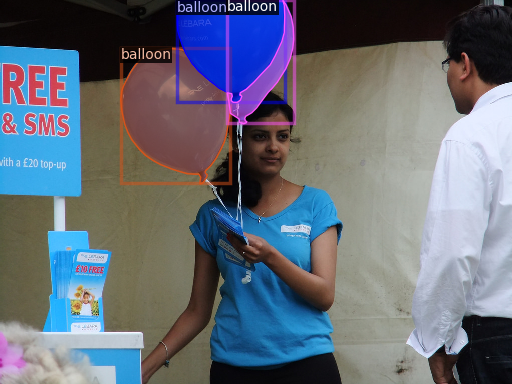

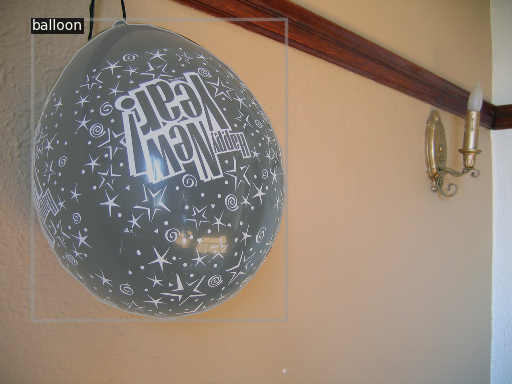

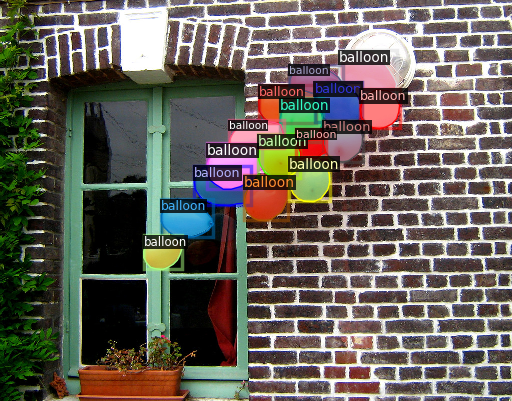

In [9]:
dataset_dicts = get_balloon_dicts(balloonData_path + "train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Instance Segmentation and Object Detection with Custom Dataset using Mask R-CNN

In [10]:
# https://github.com/facebookresearch/detectron2/tree/main/configs/COCO-InstanceSegmentation

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_new2_train",)
cfg.DATASETS.TEST = ("balloon_new2_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/31 17:24:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 182MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/31 17:24:15 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/31 17:24:28 d2.utils.events]:  eta: 0:03:32  iter: 19  total_loss: 2.177  loss_cls: 0.715  loss_box_reg: 0.645  loss_mask: 0.6973  loss_rpn_cls: 0.03671  loss_rpn_loc: 0.006302    time: 0.4355  last_time: 0.4535  data_time: 0.0296  last_data_time: 0.0055   lr: 9.7405e-06  max_mem: 2322M
[03/31 17:24:41 d2.utils.events]:  eta: 0:03:22  iter: 39  total_loss: 1.929  loss_cls: 0.6469  loss_box_reg: 0.607  loss_mask: 0.6478  loss_rpn_cls: 0.03542  loss_rpn_loc: 0.008456    time: 0.4363  last_time: 0.4771  data_time: 0.0069  last_data_time: 0.0056   lr: 1.9731e-05  max_mem: 2458M
[03/31 17:24:50 d2.utils.events]:  eta: 0:03:14  iter: 59  total_loss: 1.849  loss_cls: 0.5353  loss_box_reg: 0.6199  loss_mask: 0.5502  loss_rpn_cls: 0.03487  loss_rpn_loc: 0.008244    time: 0.4462  last_time: 0.5428  data_time: 0.0106  last_data_time: 0.0115   lr: 2.972e-05  max_mem: 2614M
[03/31 17:25:01 d2.utils.events]:  eta: 0:03:10  iter: 79  total_loss: 1.586  loss_cls: 0.4438  loss_box_reg: 0.6052  loss

In [11]:
# Look at results using tensorboard
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# **Inference** & Evaluation using the trained model

In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.DATASETS.TEST = ("ballon_new2_val")
predictor = DefaultPredictor(cfg)

[03/31 17:28:51 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [13]:
import matplotlib.pyplot as plt


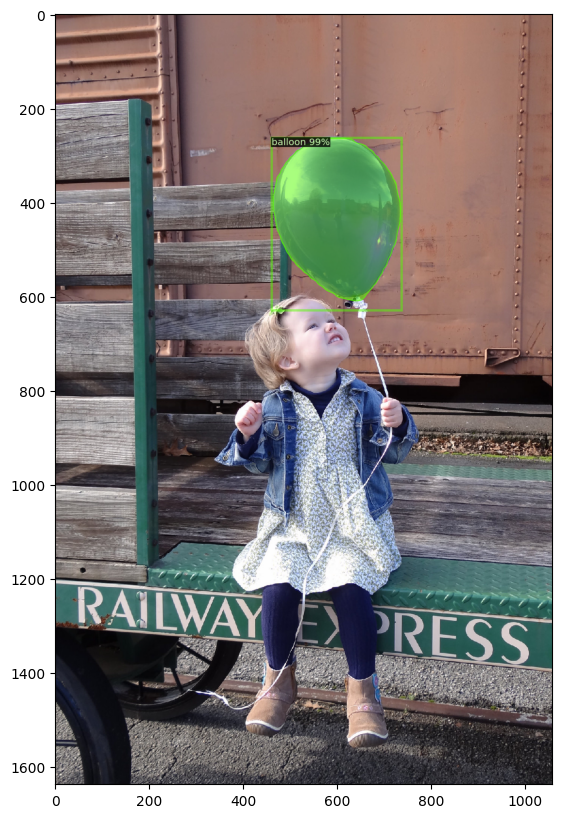

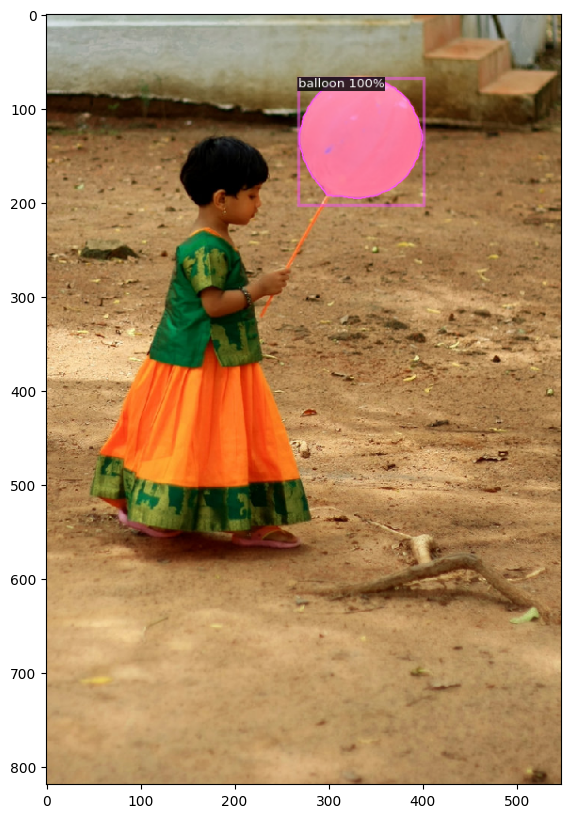

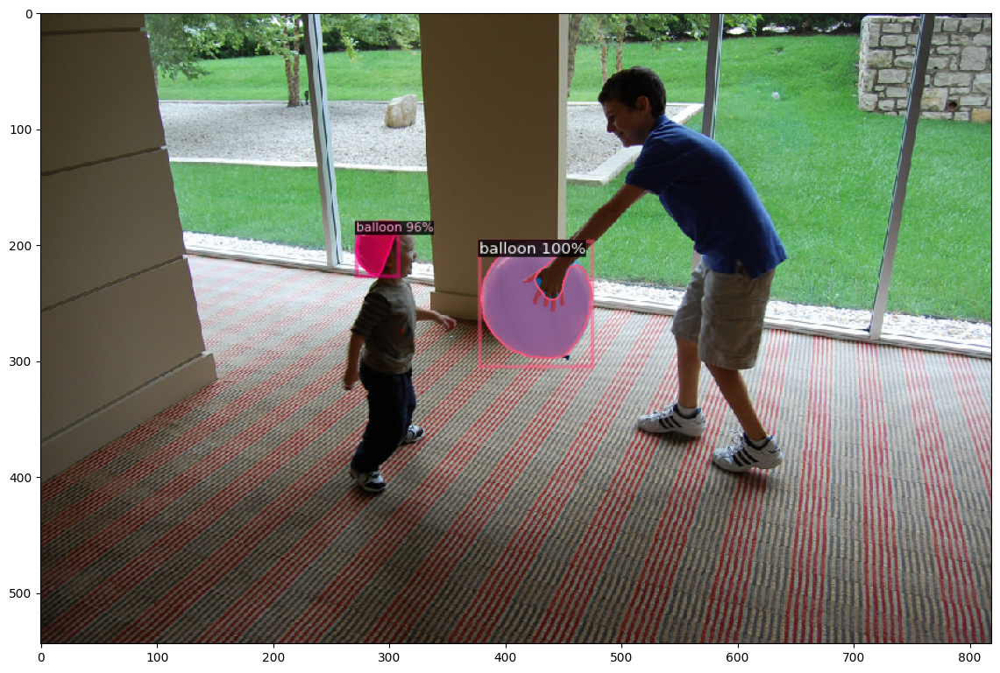

In [14]:
dataset_dicts = get_balloon_dicts(balloonData_path + "val")
for d in random.sample(dataset_dicts, 3):
  im = cv2.imread(d["file_name"])
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
  v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  plt.figure(figsize = (14, 10))
  plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
  plt.show()

# Performance Metrics
Evaluate the performance of Trained Mask RCNN using Intersection over Union (IOU) and Average Perrcision (AP) metrics implemented in COCO API.

In [20]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("balloon_new2_val", ("bbox", ), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_new2_val")

# print(inference_on_dataset(trainer.model, val_loader, evaluator))
print(inference_on_dataset(trainer.model, val_loader, evaluator=evaluator))

[03/31 17:45:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/31 17:45:55 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/31 17:45:55 d2.data.common]: Serializing 13 elements to byte tensors and concatenating them all ...
[03/31 17:45:55 d2.data.common]: Serialized dataset takes 0.04 MiB
[03/31 17:45:55 d2.evaluation.evaluator]: Start inference on 13 batches
[03/31 17:45:58 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0015 s/iter. Inference: 0.1154 s/iter. Eval: 0.0221 s/iter. Total: 0.1391 s/iter. ETA=0:00:00
[03/31 17:45:59 d2.evaluation.evaluator]: Total inference time: 0:00:01.165104 (0.145638 s / iter per device, on 1 devices)
[03/31 17:45:59 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.114272 s / iter per device, on 1 devices)
[03/31 17:45:59 d2.evaluation.coc